In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,roc_curve
from pandas_profiling import ProfileReport
import sklearn
import matplotlib.pyplot as plt
%matplotlib inline


In [2]:
df=pd.read_csv(r"C:\Users\PRASHANT\Downloads/winequality_red.csv")

In [3]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
x=df.drop(columns="quality")

In [7]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [8]:
y=df.quality

In [9]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [10]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.25,random_state=30)

In [11]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1178,5.6,0.915,0.00,2.1,0.041,17.0,78.0,0.99346,3.68,0.73,11.4
1189,8.8,0.955,0.05,1.8,0.075,5.0,19.0,0.99616,3.30,0.44,9.6
161,7.6,0.680,0.02,1.3,0.072,9.0,20.0,0.99650,3.17,1.08,9.2
109,8.1,0.785,0.52,2.0,0.122,37.0,153.0,0.99690,3.21,0.69,9.3
961,7.1,0.560,0.14,1.6,0.078,7.0,18.0,0.99592,3.27,0.62,9.3
...,...,...,...,...,...,...,...,...,...,...,...
919,8.4,0.620,0.12,1.8,0.072,38.0,46.0,0.99504,3.38,0.89,11.8
1164,9.0,0.785,0.24,1.7,0.078,10.0,21.0,0.99692,3.29,0.67,10.0
500,7.8,0.520,0.25,1.9,0.081,14.0,38.0,0.99840,3.43,0.65,9.0
941,9.9,0.270,0.49,5.0,0.082,9.0,17.0,0.99484,3.19,0.52,12.5


In [12]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1147,10.0,0.410,0.45,6.20,0.071,6.0,14.0,0.99702,3.21,0.49,11.8
659,7.1,0.840,0.02,4.40,0.096,5.0,13.0,0.99700,3.41,0.57,11.0
871,6.9,0.560,0.03,1.50,0.086,36.0,46.0,0.99522,3.53,0.57,10.6
1333,9.1,0.775,0.22,2.20,0.079,12.0,48.0,0.99760,3.18,0.51,9.6
1411,6.4,0.470,0.40,2.40,0.071,8.0,19.0,0.99630,3.56,0.73,10.6
...,...,...,...,...,...,...,...,...,...,...,...
721,8.9,0.480,0.24,2.85,0.094,35.0,106.0,0.99820,3.10,0.53,9.2
490,9.3,0.775,0.27,2.80,0.078,24.0,56.0,0.99840,3.31,0.67,10.6
575,12.3,0.270,0.49,3.10,0.079,28.0,46.0,0.99930,3.20,0.80,10.2
1051,8.5,0.460,0.59,1.40,0.414,16.0,45.0,0.99702,3.03,1.34,9.2


In [13]:
y_train

1178    5
1189    4
161     4
109     5
961     5
       ..
919     6
1164    5
500     6
941     7
421     7
Name: quality, Length: 1199, dtype: int64

In [14]:
y_test

1147    7
659     4
871     5
1333    5
1411    6
       ..
721     5
490     6
575     6
1051    5
1212    6
Name: quality, Length: 400, dtype: int64

In [15]:
dt_model=DecisionTreeClassifier()

In [16]:
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [17]:
sklearn.__version__

'1.0.2'

[Text(0.5487580726942783, 0.9722222222222222, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(0.32302452497865075, 0.9166666666666666, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(0.2028381191289496, 0.8611111111111112, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(0.07656383432963279, 0.8055555555555556, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(0.05417378309137489, 0.75, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(0.01964133219470538, 0.6944444444444444, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(0.012809564474807857, 0.6388888888888888, 'X[9] <= 0.54\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(0.009393680614859094, 0.5833333333333334, 'X[10] <= 9.025\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(0.005977796

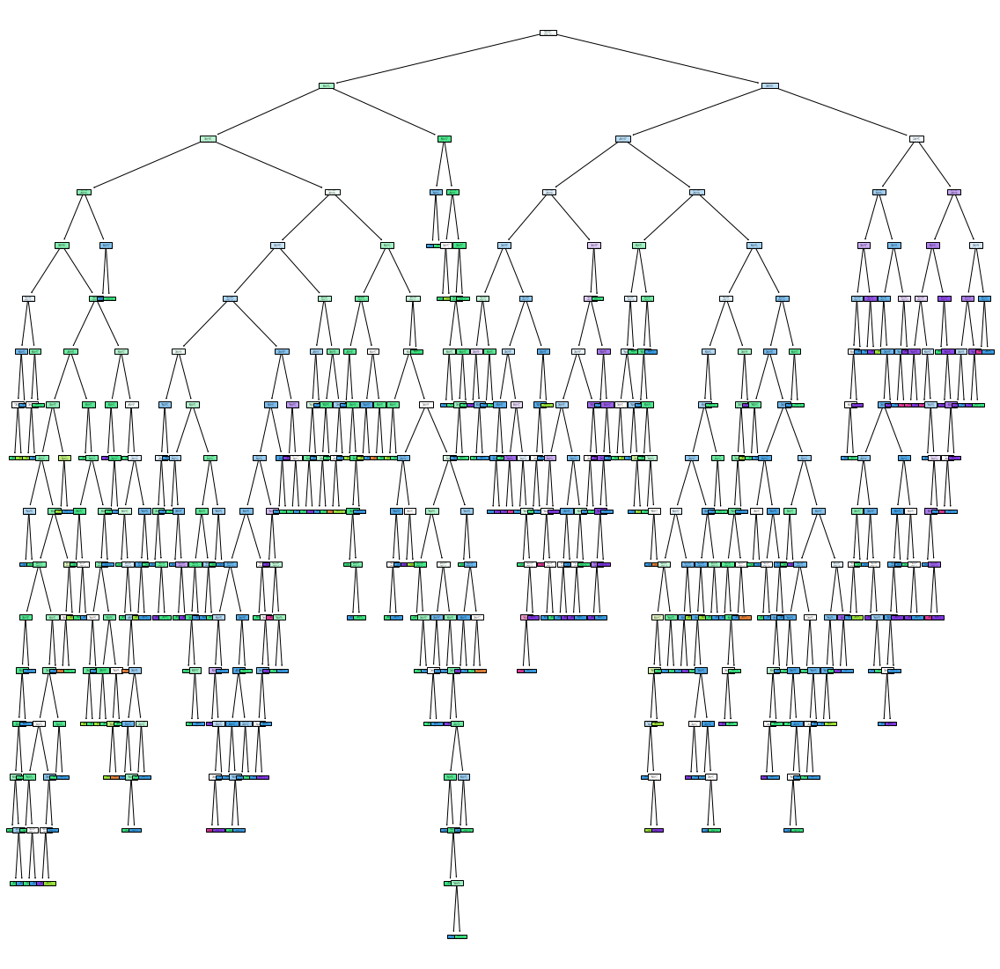

In [18]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)


In [19]:
df1=df.head(500)

In [20]:
x1=df1.drop(columns="quality")

In [21]:
x1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
495,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0
496,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.9984,3.43,0.65,9.0
497,7.2,0.34,0.32,2.5,0.090,43.0,113.0,0.9966,3.32,0.79,11.1
498,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0


In [22]:
y1=df1.quality

In [23]:
y1

0      5
1      5
2      5
3      6
4      5
      ..
495    8
496    6
497    5
498    8
499    6
Name: quality, Length: 500, dtype: int64

In [24]:
dt_model1=DecisionTreeClassifier()
dt_model1.fit(x1,y1)


DecisionTreeClassifier()

In [25]:
set(y1)

{3, 4, 5, 6, 7, 8}

[Text(0.45292275886864813, 0.9705882352941176, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(0.287032598274209, 0.9117647058823529, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(0.18096836049856185, 0.8529411764705882, 'X[2] <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(0.08581016299137105, 0.7941176470588235, 'X[10] <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]'),
 Text(0.030680728667305847, 0.7352941176470589, 'X[9] <= 0.54\ngini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]'),
 Text(0.023010546500479387, 0.6764705882352942, 'X[6] <= 26.5\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]'),
 Text(0.015340364333652923, 0.6176470588235294, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(0.030680728667305847, 0.6176470588235294, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]'),
 Text(0.038350910834132314, 0.6764705882352942, 'gin

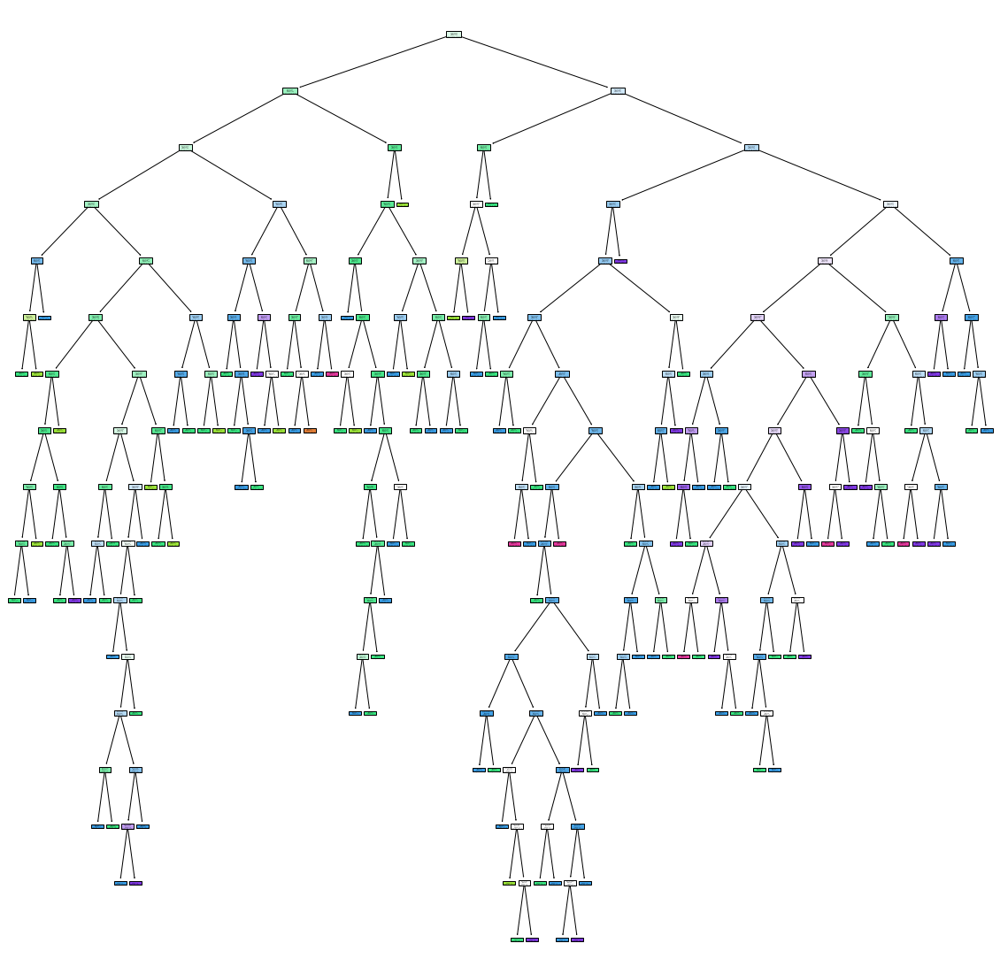

In [26]:
"""in this decision tree value = [1,21,5,3] shows the class 4=1,5=21,6=5,7=3
  x[1]=select 3rd column as a parent node"""

plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1,filled=True)


[Text(0.45292275886864813, 0.9705882352941176, 'alcohol <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]\nclass = 5'),
 Text(0.287032598274209, 0.9117647058823529, 'total sulfur dioxide <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]\nclass = 5'),
 Text(0.18096836049856185, 0.8529411764705882, 'citric acid <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]\nclass = 5'),
 Text(0.08581016299137105, 0.7941176470588235, 'alcohol <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]\nclass = 5'),
 Text(0.030680728667305847, 0.7352941176470589, 'sulphates <= 0.54\ngini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]\nclass = 6'),
 Text(0.023010546500479387, 0.6764705882352942, 'total sulfur dioxide <= 26.5\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]\nclass = 4'),
 Text(0.015340364333652923, 0.6176470588235294, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]\nclass = 5'),
 Text(0.030680728667305847, 0.6

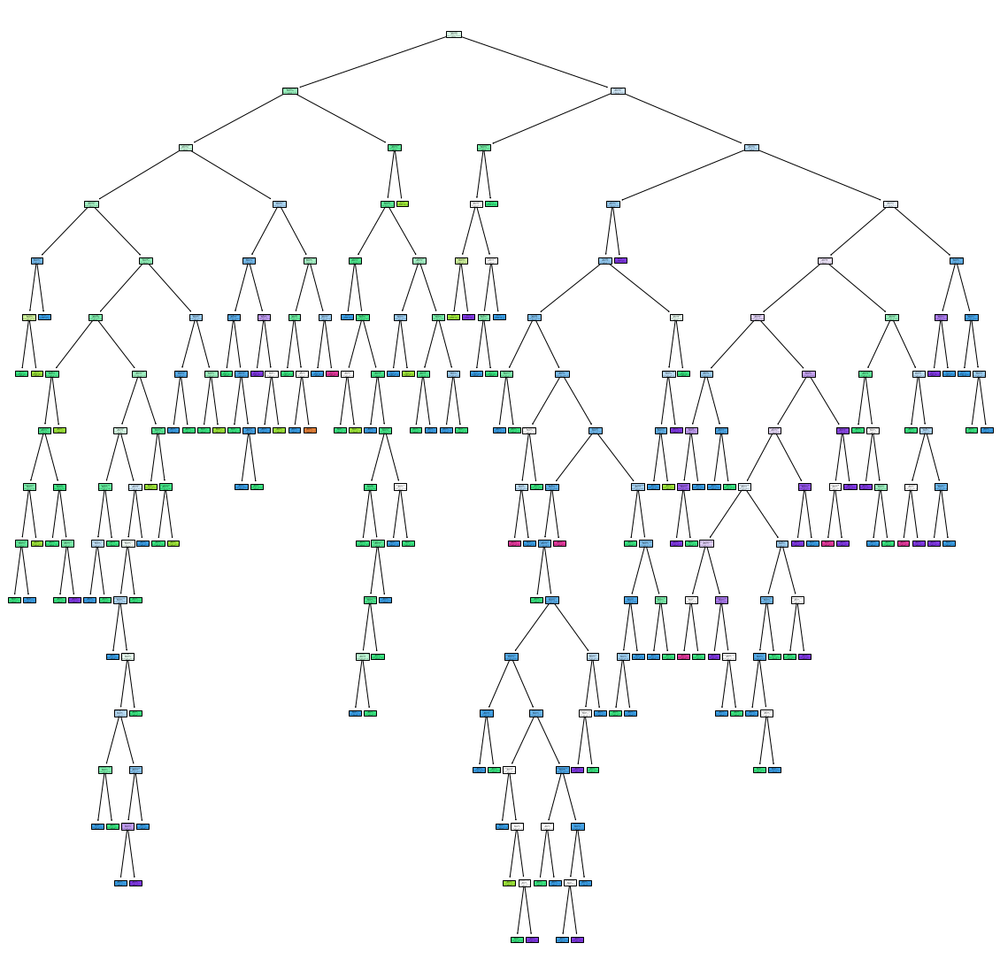

In [27]:
#we should define a column name feature_names=x1.columns
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1,filled=True, class_names=[str(i) for i in set(y1)] , feature_names=x1.columns)

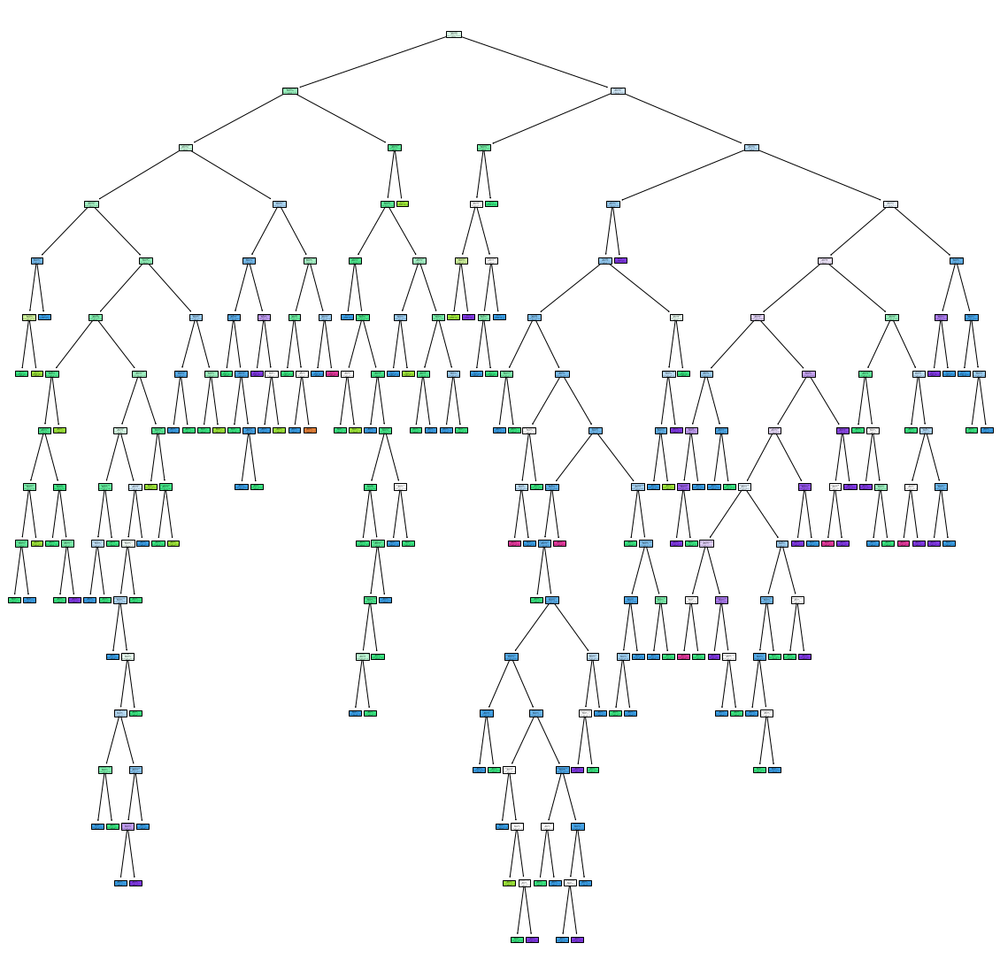

In [28]:
# we should save a fig file should be save in cwd
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1,filled=True, class_names=[str(i) for i in set(y1)] , feature_names=x1.columns)
plt.savefig("dt_model_1")



In [29]:
#we should predict a model
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [30]:
#we should check the model accuracy with train dataset
dt_model1.score(x1,y1)

1.0

In [31]:
"""# we should check the model accuracy with test dataset
# our model is over fitted beacause the differnce between training dataset and testing dataset is huge """
dt_model1.score(x_test,y_test)

0.6075

In [32]:
""" pruning is used to remove branches of decision tree 
    cost_complexity_pruning_path =ccp(shortform)or hyper parameter tuning
    ccp is a threshold where we create a limit after these limit the tree should be pruning or remove 
    
"""

path=dt_model1.cost_complexity_pruning_path(x1,y1)
path

{'ccp_alphas': array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
        0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.00247552, 0.00261111, 0.00262769,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00272222, 0.00283333,
        0.00285714, 0.003     , 0.003     , 0.003     , 0.003     ,
        0.00304762, 0.00305051, 0.00308418, 0.00328205, 0.00333333,
        0.00333333, 0.00334032, 0.00336606, 0.00342857, 0.00343316,
        0.0035    , 0.0035    , 0.0036    , 0.00363636, 0.00373809,
        0.0038    , 0.0038237 , 0.004     , 0.00404444, 0.00428571,
        0.00428571, 0.00437662, 0.00462338, 0.00465709, 0.00466667,
        0.0048    , 0.00487179, 0.00504242, 0.00508235, 0.00509091,
        0.00510606, 0.00516667, 0.00568485, 0.00589394, 0.00656364,
        0.00671079, 0.0067591 , 0.

In [33]:
ccp_alpha = path.ccp_alphas
ccp_alpha

array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
       0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.00247552, 0.00261111, 0.00262769,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00272222, 0.00283333,
       0.00285714, 0.003     , 0.003     , 0.003     , 0.003     ,
       0.00304762, 0.00305051, 0.00308418, 0.00328205, 0.00333333,
       0.00333333, 0.00334032, 0.00336606, 0.00342857, 0.00343316,
       0.0035    , 0.0035    , 0.0036    , 0.00363636, 0.00373809,
       0.0038    , 0.0038237 , 0.004     , 0.00404444, 0.00428571,
       0.00428571, 0.00437662, 0.00462338, 0.00465709, 0.00466667,
       0.0048    , 0.00487179, 0.00504242, 0.00508235, 0.00509091,
       0.00510606, 0.00516667, 0.00568485, 0.00589394, 0.00656364,
       0.00671079, 0.0067591 , 0.00688352, 0.00688889, 0.007  

In [34]:
#we should build a model multiple model depends on ccp_alpha value or we can say 
#that hyperparameter tuning

dt_model_2=[]
for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_model_2.append(dt_m)

In [38]:
dt_model_2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.0018500000000000005),
 DecisionTreeClassifier(ccp_alpha=0.001866666666666667),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.0024755244755244737),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 DecisionTreeClassifier(ccp_alp

In [39]:
# using list comprenshisation
#these is a training accuracy of above model dt_model_2
[i.score(x1,y1) for i in dt_model_2]

[1.0,
 0.998,
 0.994,
 0.994,
 0.99,
 0.992,
 0.986,
 0.988,
 0.962,
 0.962,
 0.96,
 0.966,
 0.964,
 0.964,
 0.964,
 0.958,
 0.96,
 0.96,
 0.952,
 0.944,
 0.928,
 0.93,
 0.932,
 0.932,
 0.928,
 0.928,
 0.93,
 0.928,
 0.926,
 0.922,
 0.924,
 0.918,
 0.916,
 0.916,
 0.92,
 0.918,
 0.912,
 0.904,
 0.904,
 0.9,
 0.898,
 0.9,
 0.898,
 0.886,
 0.886,
 0.886,
 0.88,
 0.88,
 0.878,
 0.87,
 0.866,
 0.864,
 0.86,
 0.858,
 0.858,
 0.856,
 0.842,
 0.838,
 0.834,
 0.818,
 0.824,
 0.81,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.596,
 0.596,
 0.596,
 0.558,
 0.478]

In [40]:
#by normal for loop
#these is a training accuracy of above model dt_model_2
l=[]
for accuracy in dt_model_2:
    acc=accuracy.score(x1,y1)
    l.append(acc)
   
    

In [41]:
l

[1.0,
 0.998,
 0.994,
 0.994,
 0.99,
 0.992,
 0.986,
 0.988,
 0.962,
 0.962,
 0.96,
 0.966,
 0.964,
 0.964,
 0.964,
 0.958,
 0.96,
 0.96,
 0.952,
 0.944,
 0.928,
 0.93,
 0.932,
 0.932,
 0.928,
 0.928,
 0.93,
 0.928,
 0.926,
 0.922,
 0.924,
 0.918,
 0.916,
 0.916,
 0.92,
 0.918,
 0.912,
 0.904,
 0.904,
 0.9,
 0.898,
 0.9,
 0.898,
 0.886,
 0.886,
 0.886,
 0.88,
 0.88,
 0.878,
 0.87,
 0.866,
 0.864,
 0.86,
 0.858,
 0.858,
 0.856,
 0.842,
 0.838,
 0.834,
 0.818,
 0.824,
 0.81,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.596,
 0.596,
 0.596,
 0.558,
 0.478]

In [42]:
train_score=[i.score(x1,y1) for i in dt_model_2]
train_score

[1.0,
 0.998,
 0.994,
 0.994,
 0.99,
 0.992,
 0.986,
 0.988,
 0.962,
 0.962,
 0.96,
 0.966,
 0.964,
 0.964,
 0.964,
 0.958,
 0.96,
 0.96,
 0.952,
 0.944,
 0.928,
 0.93,
 0.932,
 0.932,
 0.928,
 0.928,
 0.93,
 0.928,
 0.926,
 0.922,
 0.924,
 0.918,
 0.916,
 0.916,
 0.92,
 0.918,
 0.912,
 0.904,
 0.904,
 0.9,
 0.898,
 0.9,
 0.898,
 0.886,
 0.886,
 0.886,
 0.88,
 0.88,
 0.878,
 0.87,
 0.866,
 0.864,
 0.86,
 0.858,
 0.858,
 0.856,
 0.842,
 0.838,
 0.834,
 0.818,
 0.824,
 0.81,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.596,
 0.596,
 0.596,
 0.558,
 0.478]

In [44]:
test_score =[i.score(x_test,y_test)for i in dt_model_2]
test_score

[0.585,
 0.5825,
 0.6125,
 0.585,
 0.6175,
 0.6125,
 0.58,
 0.58,
 0.5875,
 0.58,
 0.575,
 0.5775,
 0.5975,
 0.5775,
 0.5975,
 0.57,
 0.605,
 0.5775,
 0.5875,
 0.62,
 0.58,
 0.5925,
 0.5925,
 0.63,
 0.6025,
 0.59,
 0.605,
 0.605,
 0.6,
 0.5925,
 0.59,
 0.5825,
 0.595,
 0.5975,
 0.61,
 0.5975,
 0.605,
 0.605,
 0.6025,
 0.6025,
 0.6225,
 0.595,
 0.5925,
 0.615,
 0.6075,
 0.6,
 0.605,
 0.595,
 0.6025,
 0.6075,
 0.5925,
 0.6125,
 0.595,
 0.6,
 0.61,
 0.6075,
 0.6075,
 0.615,
 0.6075,
 0.6075,
 0.6,
 0.6125,
 0.615,
 0.6175,
 0.6075,
 0.6075,
 0.605,
 0.5975,
 0.5925,
 0.5875,
 0.59,
 0.5825,
 0.5825,
 0.5925,
 0.59,
 0.585,
 0.5825,
 0.5825,
 0.56,
 0.5725,
 0.5625,
 0.555,
 0.555,
 0.54,
 0.5775,
 0.5775,
 0.5775,
 0.545,
 0.4225]

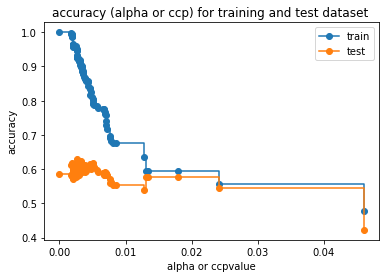

In [45]:
#these chart for given dataset head(30) if we increase the value of dataset head(500) our alpha or accuracy 
# value should be near so that we should over come from overtfitted model
fig, ax = plt.subplots()
ax.set_xlabel("alpha or ccpvalue")
ax.set_ylabel("accuracy")
ax.set_title("accuracy (alpha or ccp) for training and test dataset ")
ax.plot(ccp_alpha, train_score, marker='o', label='train', drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label='test', drawstyle="steps-post")
ax.legend()
plt.show()

In [46]:
#we build a new model with ccp_alpha value 
dt_model_ccp = DecisionTreeClassifier(random_state=0,ccp_alpha=0.014)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(0.5, 0.8333333333333334, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(0.25, 0.5, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(0.75, 0.5, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

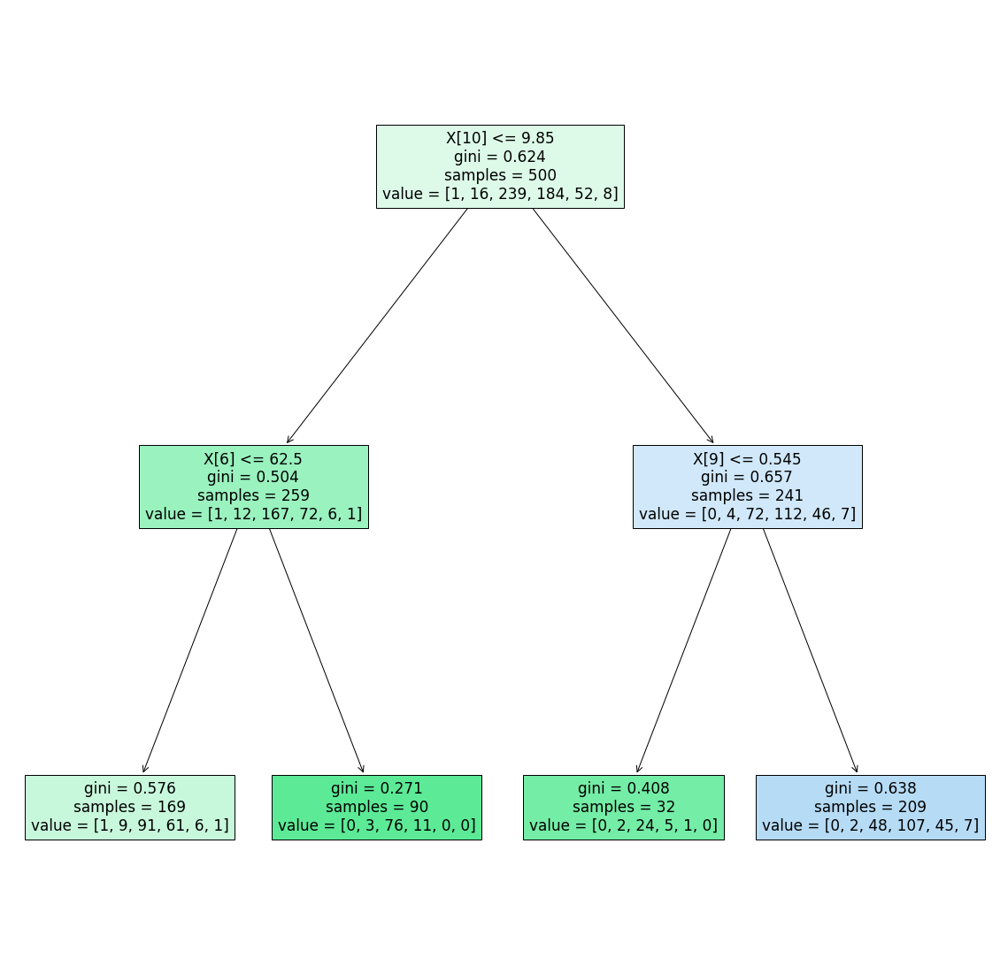

In [47]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

we should minimize  the difference between train and test dataset accuracy previously it is very
huge 
by identifying the (ccp or alpha or hyperparameter value ) 

In [48]:
dt_model_ccp.score(x1,y1)

0.596

In [49]:
dt_model_ccp.score(x,y)

0.5697310819262039

In [50]:
dt_model_ccp.score(x_test,y_test)

0.5775

#how we find a best parameter to build a best model  
#in the above experiment we should consider a only one parameter ccp_alpha
we use gridsearch cv changing the parameter and build a new model


In [51]:
DecisionTreeClassifier()

DecisionTreeClassifier()

we should change whole parameter to fit the model

grid_parameter={"criterion":['gini','entropy'],
                "splitter":['best','random'],
                 "max_depth":range(2,40,1),
                " min_samples_split":range(2,10,2),
                 "min_samples_leaf":range(1,10,1),
                 "min_weight_fraction_leaf":range(2,10,1),
                 "max_features":range(2,10,1),
                 "random_state":range(2,10,1),
                 "max_leaf_nodes":range(2,10,1),
                " min_impurity_decrease":range(2,10,1),
                 "class_weight":range(2,10,1),
                 "ccp_alpha":range(0,1,),
               }

In [114]:
grid_parameter={"criterion":['gini','entropy'],
                "splitter":['best','random'],
                 "max_depth":range(2,40,1),
              # 'min_samples_split':range(3,10,1),
                 "min_samples_leaf":range(1,10,1),}

In [117]:
#grid_ccp=GridSearchCV(estimator=dt_model_ccp,param_grid=grid_parameter,cv = 5,n_jobs=-1)
grid_ccp = GridSearchCV(estimator=dt_model_ccp,param_grid=grid_parameter , cv = 10 , n_jobs=-1)

In [118]:
#grid_ccp.estimator.get_params().keys()
grid_ccp.fit(x1,y1)
    

C:\Users\PRASHANT\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(


GridSearchCV(cv=10,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'splitter': ['best', 'random']})

In [119]:
grid_ccp.best_params_

{'criterion': 'entropy',
 'max_depth': 15,
 'min_samples_leaf': 2,
 'splitter': 'random'}

In [120]:
new_model_gccp=DecisionTreeClassifier(criterion = 'entropy', max_depth= 15,min_samples_leaf= 2, splitter= 'random',ccp_alpha=0.014)
new_model_gccp.fit(x1,y1)
new_model_gccp

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=15,
                       min_samples_leaf=2, splitter='random')

[Text(0.6710526315789473, 0.9444444444444444, 'X[0] <= 9.617\nentropy = 1.652\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(0.4473684210526316, 0.8333333333333334, 'X[6] <= 112.483\nentropy = 1.502\nsamples = 370\nvalue = [0, 15, 207, 120, 25, 3]'),
 Text(0.39473684210526316, 0.7222222222222222, 'X[1] <= 0.76\nentropy = 1.557\nsamples = 330\nvalue = [0, 14, 172, 116, 25, 3]'),
 Text(0.21052631578947367, 0.6111111111111112, 'X[1] <= 0.375\nentropy = 1.478\nsamples = 293\nvalue = [0, 8, 156, 106, 21, 2]'),
 Text(0.10526315789473684, 0.5, 'X[0] <= 9.322\nentropy = 1.6\nsamples = 40\nvalue = [0, 0, 12, 21, 5, 2]'),
 Text(0.05263157894736842, 0.3888888888888889, 'entropy = 1.339\nsamples = 34\nvalue = [0, 0, 10, 21, 2, 1]'),
 Text(0.15789473684210525, 0.3888888888888889, 'entropy = 1.459\nsamples = 6\nvalue = [0, 0, 2, 0, 3, 1]'),
 Text(0.3157894736842105, 0.5, 'X[10] <= 11.575\nentropy = 1.401\nsamples = 253\nvalue = [0, 8, 144, 85, 16, 0]'),
 Text(0.2631578947368421, 0.3888888

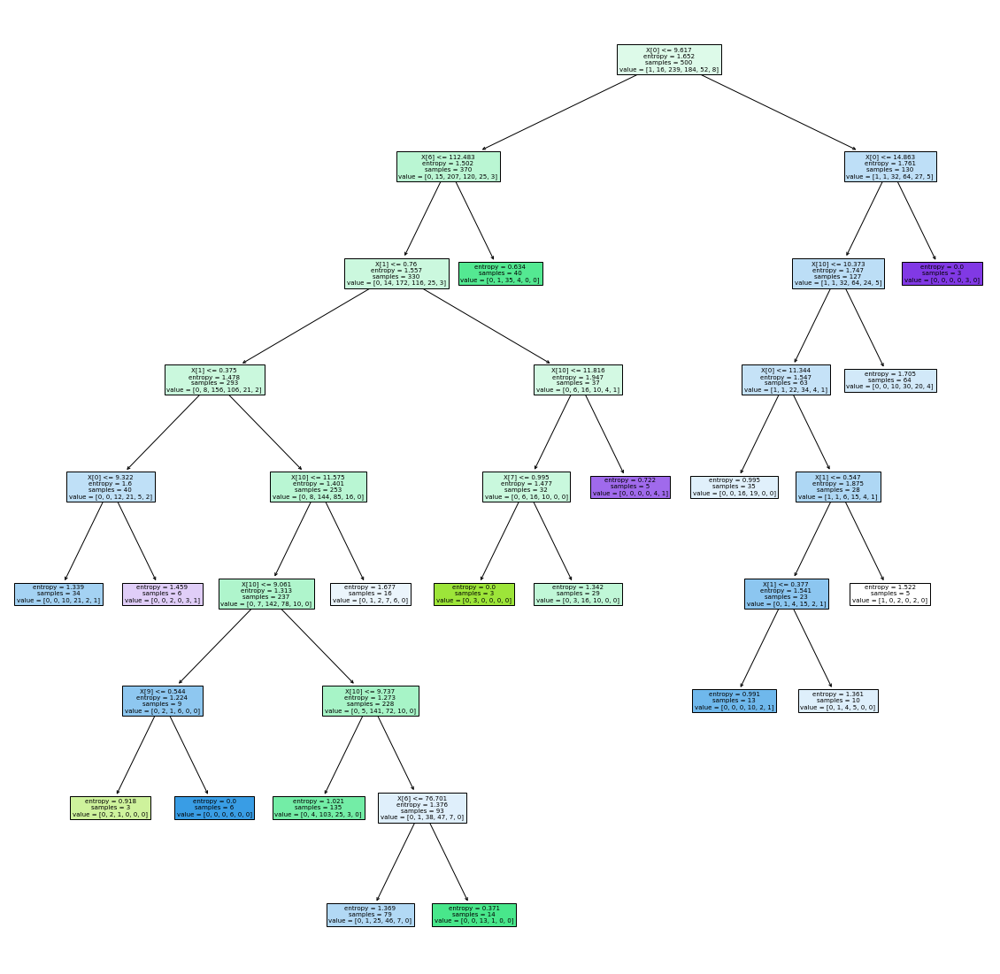

In [121]:
plt.figure(figsize=(20,20))
tree.plot_tree(new_model_gccp,filled=True)

#there is huge difference between test and train dataset after hyperparameter tuning 
#we should not say that we do hyperparameter tuning then our model is overcome from over fitted   model

In [122]:
new_model_gccp.score(x1,y1)

0.656

In [123]:
new_model_gccp.score(x,y)

0.5653533458411507

In [125]:
new_model_gccp.score(x_test,y_test)

0.595

In [126]:
# multi class confusion matrix

In [129]:
pred=new_model_gccp.predict(x_train)
pred

array([4, 5, 5, ..., 6, 6, 7], dtype=int64)

In [133]:
# 00000 means there is no class here
#
confusion_matrix(y_train,pred)

array([[  0,   1,   4,   3,   0,   0],
       [  0,   2,  18,  15,   0,   0],
       [  0,   3, 291, 212,   6,   0],
       [  0,   4, 104, 365,   4,   0],
       [  0,   0,   6, 139,   8,   0],
       [  0,   0,   0,  13,   1,   0]], dtype=int64)